# SCENIC Protocol - Case study - Selected cancer scRNA-seq data sets

__Author:__ Bram Van de Sande

__Date:__ 15 JUN 2019

__Outline:__ SCENIC workflow for selected scRNAseq experiment on human cancer biopsies.

| Accession ID | Cancer type | 
| ------------- | ----------- | 
| GSE115978     | SKCM        | 
| GSE103322     | HNSC | 
| E-MTAB-6149/E-MTAB-6653 | LUSC, LUAD |


Cancer type acronyms are taken from TCGA: https://gdc.cancer.gov/resources-tcga-users/tcga-code-tables/tcga-study-abbreviations


> This notebook can be run in a miniconda environment which can be installed and configured as a Jupyter kernel via the 
> following script: https://github.com/aertslab/pySCENIC/blob/master/miniconda_environment_installation.sh

__TODO: Binarization heatmap with logo's.__

__TODO__ Matrixplot might be better than dotplot
pl.matrixplot(adata, var_names[, groupby, …]) Also create heatmap with most cell type specific regulats ... alla Z-score approach!

__TODO: Investigate better binarization methods: GMM, KDE, ... position of troughs and peaks__

__TODO: Pimp binarization plot__

__TODO: Workout SKCM!!__

__TODO: Create figures for publication__

In [54]:
import os, glob, re, pickle
from functools import partial
from collections import OrderedDict
import operator as op

from cytoolz import compose

import pandas as pd
import seaborn as sns
import numpy as np
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt

from pyscenic.export import export2loom, add_scenic_metadata
from pyscenic.utils import load_motifs
from pyscenic.transform import df2regulons
from pyscenic.aucell import aucell
from pyscenic.binarization import binarize

In [4]:
# Set maximum number of jobs for Scanpy.
sc.settings.njobs = 32

Folder structure.

In [135]:
RESOURCES_FOLDERNAME = "/Users/bramvandesande/Projects/lcb/protocol/resources/"
AUXILLIARIES_FOLDERNAME = "/Users/bramvandesande/Projects/lcb/protocol/auxilliaries/"
RESULTS_FOLDERNAME = "/Users/bramvandesande/Projects/lcb/protocol/results/"
FIGURES_FOLDERNAME = "/Users/bramvandesande/Projects/lcb/protocol/figures/"

In [136]:
sc.settings.figdir = FIGURES_FOLDERNAME

Auxilliary functions.

In [188]:
def savesvg(fname: str, fig, folder: str=FIGURES_FOLDERNAME) -> None:
    """
    Save figure as vector-based SVG image format.
    """
    fig.tight_layout()
    fig.savefig(os.path.join(folder, fname), format='svg')

Auxilliary data sets.

In [33]:
# Downloaded fromm pySCENIC github repo: https://github.com/aertslab/pySCENIC/tree/master/resources
HUMAN_TFS_FNAME = os.path.join(AUXILLIARIES_FOLDERNAME, 'lambert2018.txt')
# Ranking databases. Downloaded from cisTargetDB: https://resources.aertslab.org/cistarget/
RANKING_DBS_FNAMES = list(map(lambda fn: os.path.join(AUXILLIARIES_FOLDERNAME, fn),
                       ['hg19-500bp-upstream-10species.mc9nr.feather',
                       'hg19-tss-centered-5kb-10species.mc9nr.feather',
                        'hg19-tss-centered-10kb-10species.mc9nr.feather']))
# Motif annotations. Downloaded from cisTargetDB: https://resources.aertslab.org/cistarget/
MOTIF_ANNOTATIONS_FNAME = os.path.join(AUXILLIARIES_FOLDERNAME, 'motifs-v9-nr.hgnc-m0.001-o0.0.tbl')

## GSE115978 - Cutaneous Melanoma (SKCM)

_Publication:_ Jerby-Arnon L et al. A Cancer Cell Program Promotes T Cell Exclusion and Resistance to Checkpoint Blockade. Cell 2018 https://dx.doi.org/10.1016/j.cell.2018.09.006

_Data set acquisition:_ https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE115978

_Remarks:_
1. This data set includes samples from previous study (Itay Tirosh et al.).
2. Codes:

| Code | Description |
| ---- | ----------- |
| OR | Objective Response |
| ICI | Immune Checkpoint Inhibitor |

In [10]:
DATASET_ID = "GSE115978"
TCGA_CODE = 'SKCM'

Resources downloaded.

In [12]:
# Downloaded from GEO on 28 FEB 2019.
CELL_ANNOTATIONS_FNAME = os.path.join(RESOURCES_FOLDERNAME, "GSE115978_cell.annotations.csv")
# Downloaded from Cell Journal website on 1 MAR 2019.
SAMPLE_METADATA_FNAME = os.path.join(RESOURCES_FOLDERNAME, "1-s2.0-S0092867418311784-mmc1.xlsx")
# Downloaded from GEO on 1 MAR 2019.
EXP_MTX_TPM_FNAME = os.path.join(RESOURCES_FOLDERNAME, 'GSE115978_tpm.csv')
EXP_MTX_COUNTS_FNAME = os.path.join(RESOURCES_FOLDERNAME, 'GSE115978_counts.csv')

Results created.

In [40]:
METADATA_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.metadata.csv'.format(DATASET_ID))
EXP_MTX_QC_FNAME = os.path.join(RESULTS_FOLDERNAME, 'GSE115978.qc.tpm.csv')
ADJACENCIES_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.adjacencies.tsv'.format(DATASET_ID))
MOTIFS_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.motifs.csv'.format(DATASET_ID))
REGULONS_DAT_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.regulons.dat'.format(DATASET_ID))
AUCELL_MTX_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.auc.csv'.format(DATASET_ID))
ANNDATA_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.h5ad'.format(DATASET_ID))
LOOM_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}_{}.loom'.format(TCGA_CODE, DATASET_ID))

### STEP 0: Preprocessing

__METADATA CLEANING__

In [23]:
df_annotations = pd.read_csv(CELL_ANNOTATIONS_FNAME)
df_annotations['samples'] = df_annotations['samples'].str.upper()
df_annotations.rename(columns={'cell.types': 'cell_type', 'cells': 'cell_id', 'samples': 'sample_id', 
                               'treatment.group': 'treatment_group', 'Cohort': 'cohort'}, inplace=True)
df_annotations['cell_type'] = df_annotations.cell_type.replace({
    'Mal': 'Malignant Cell',
    'Endo.': 'Endothelial Cell',
    'T.CD4': 'Thelper Cell',
    'CAF': 'Fibroblast',
    'T.CD8': 'Tcytotoxic Cell',
    'T.cell': 'T Cell',
    'NK': 'NK Cell',
    'B.cell': 'B Cell'})
df_samples = pd.read_excel(SAMPLE_METADATA_FNAME, header=2)
df_samples = df_samples.drop(['Cohort'], axis=1)
df_samples['Sample'] = df_samples.Sample.str.upper()
df_metadata = pd.merge(df_annotations, df_samples, left_on='sample_id', right_on='Sample')
df_metadata = df_metadata.drop(['Sample', 'treatment_group'], axis=1)
df_metadata.rename(columns={'Patient': 'patient_id',
                           'Age': 'age', 'Sex': 'sex', 'Lesion type': 'lesion_type', 'Site': 'site',
                           'Treatment': 'treatment', 'Treatment group': 'treatment_group'}, inplace=True)
df_metadata.to_csv(METADATA_FNAME, index=False)
df_metadata.head()

,cell_id,sample_id,cell_type,cohort,no.of.genes,no.of.reads,patient_id,age,sex,treatment,treatment_group,lesion_type,site
0,cy78_CD45_neg_1_B04_S496_comb,MEL78,Malignant Cell,Tirosh,8258,357919,Mel78,73,M,"WDVAX, ipilimumab + nivolumab",Post-ICI (resistant),metastasis,Small bowel
1,cy78_CD45_neg_3_H06_S762_comb,MEL78,Malignant Cell,Tirosh,7409,380341,Mel78,73,M,"WDVAX, ipilimumab + nivolumab",Post-ICI (resistant),metastasis,Small bowel
2,cy78_CD45_neg_1_D07_S523_comb,MEL78,Malignant Cell,Tirosh,8548,394632,Mel78,73,M,"WDVAX, ipilimumab + nivolumab",Post-ICI (resistant),metastasis,Small bowel
3,cy78_CD45_neg_3_D01_S709_comb,MEL78,Malignant Cell,Tirosh,8472,425938,Mel78,73,M,"WDVAX, ipilimumab + nivolumab",Post-ICI (resistant),metastasis,Small bowel
4,cy78_CD45_neg_2_B08_S596_comb,MEL78,Malignant Cell,Tirosh,6475,70466,Mel78,73,M,"WDVAX, ipilimumab + nivolumab",Post-ICI (resistant),metastasis,Small bowel


__EXPRESSION MATRIX QC__

In [24]:
df_tpm = pd.read_csv(EXP_MTX_TPM_FNAME, index_col=0)
df_tpm.shape

(23686, 7186)

In [25]:
#df_counts = pd.read_csv(EXP_MTX_COUNTS_FNAME, index_col=0)
#df_counts.shape

In [28]:
adata = sc.AnnData(X=df_tpm.T.sort_index())
df_obs = df_metadata[['cell_id', 'sample_id', 'cell_type', 'cohort', 'patient_id', 'age', 'sex', 'treatment',
                                                           'treatment_group', 'lesion_type', 'site']].set_index('cell_id').sort_index()
adata.obs = df_obs
adata.var_names_make_unique()
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
adata.raw = adata #Store non-log transformed data as raw. This data can be used via the use_raw parameters available for many functions.
sc.pp.log1p(adata)
adata

AnnData object with n_obs × n_vars = 7186 × 22527 
    obs: 'sample_id', 'cell_type', 'cohort', 'patient_id', 'age', 'sex', 'treatment', 'treatment_group', 'lesion_type', 'site', 'n_genes'
    var: 'n_cells'

In [29]:
adata.to_df().to_csv(EXP_MTX_QC_FNAME)

### STEP 1: Network inference based on GRNBoost2 from CLI

For this step the CLI version of SCENIC is used. This step can be deployed on an High Performance Computing system.

_Output:_ List of adjacencies between a TF and its targets stored in `ADJACENCIES_FNAME`.

In [ ]:
!pyscenic grn {EXP_MTX_QC_FNAME} {HUMAN_TFS_FNAME} -o {ADJACENCIES_FNAME} --num_workers 4

```
2019-04-25 11:22:20,360 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.
2019-04-25 11:23:37,612 - pyscenic.cli.pyscenic - INFO - Inferring regulatory networks.
preparing dask client
parsing input
creating dask graph
4 partitions
computing dask graph
not shutting down client, client was created externally
finished
2019-04-26 03:58:01,096 - pyscenic.cli.pyscenic - INFO - Writing results to file.
```

### STEP 2-3: Regulon prediction aka cisTarget from CLI

For this step the CLI version of SCENIC is used. This step can be deployed on an High Performance Computing system.

_Output:_ List of adjacencies between a TF and its targets stored in `MOTIFS_FNAME`.

In [35]:
DBS_PARAM = ' '.join(RANKING_DBS_FNAMES)

In [ ]:
!pyscenic ctx {ADJACENCIES_FNAME} {DBS_PARAM} \
            --annotations_fname {MOTIF_ANNOTATIONS_FNAME} \
            --expression_mtx_fname {EXP_MTX_QC_FNAME} \
            --output {MOTIFS_FNAME} \
            --num_workers 26

```
2019-04-26 10:23:50,395 - pyscenic.cli.pyscenic - INFO - Creating modules.
2019-04-26 10:23:56,229 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.
2019-04-26 10:29:09,101 - pyscenic.cli.pyscenic - INFO - Loading databases.
2019-04-26 10:29:09,101 - pyscenic.cli.pyscenic - INFO - Calculating regulons.
2019-04-26 11:11:10,784 - pyscenic.cli.pyscenic - INFO - Writing results to file
```

The results is a list of enriched motifs for the modules.

| Column name | Description |
| ----------- | ----------- |
| TF | Transcription Factor (TF) for which an enriched motif is discovered. |
| motifID | The identifier of the enriched motif. |
| AUC | Area Under the recovery Curve statistic for this enriched motif. |
| NES | Normalized Enrichment Score for this enriched motif. |
| Context | Collection of tags clarifying the origin of the module for this factor: e.g. ranking database, ... |
| Annotation | Verbose description of the annotation available for this motif. |
| MotifSimilarityQvalue | The TomTom derived Q-value for motif similarity (if used for assigning the factor to this enriched motif). |
| OrthologousIdentity | The Amino Acid Identity between factors (if used for assigning the factor to this enriched motif). |
| RankAtMax | The position of the Leading Edge which is used as a threshold on the whole genome ranking of the motif to decide if a gene in the input is a direct target of a TF that binds this motif. |
| TargetGenes | A list of pairs: genes and their associated weights from GENIE3/GRNBoost2. |

In [41]:
df_motifs = load_motifs(MOTIFS_FNAME)

In [42]:
df_motifs.head()

Enrichment  \
                                                AUC   
TF    MotifID                                         
ASCL1 swissregulon__hs__MYFfamily.p2       0.050424   
ATF1  dbcorrdb__BRCA1__ENCSR000EDB_1__m1   0.041473   
ATF3  transfac_public__M00039              0.044822   
      dbcorrdb__ATF3__ENCSR000BJY_1__m3    0.046101   
      dbcorrdb__CREB1__ENCSR000BRB_1__m1   0.046069   

                                                                                             \
                                                                                 Annotation   
TF    MotifID                                                                                 
ASCL1 swissregulon__hs__MYFfamily.p2      gene is orthologous to ENSMUSG00000020052 in M...   
ATF1  dbcorrdb__BRCA1__ENCSR000EDB_1__m1  gene is annotated for similar motif dbcorrdb__...   
ATF3  transfac_public__M00039             gene is annotated for similar motif transfac_p...   
      dbcorrdb__ATF3__ENCSR000BJY_1__m3                          gene is directly annotated   
      dbcorrdb__CREB1__ENCSR000BRB_1__m1  motif similar to dbcorrdb__ATF3__ENCSR000BKC_1...   

                                                                                             \
                                                                                    Context   
TF    MotifID                                                                                 
ASCL1 swissregulon__hs__MYFfamily.p2      (hg19-500bp-upstream-10species, weight>75.0%, ...   
ATF1  dbcorrdb__BRCA1__ENCSR000EDB_1__m1  (hg19-500bp-upstream-10species, weight>75.0%, ...   
ATF3  transfac_public__M00039             (hg19-500bp-upstream-10species, weight>75.0%, ...   
      dbcorrdb__ATF3__ENCSR000BJY_1__m3   (hg19-500bp-upstream-10species, weight>75.0%, ...   
      dbcorrdb__CREB1__ENCSR000BRB_1__m1  (hg19-500bp-upstream-10species, weight>75.0%, ...   

                                                                          \
                                         MotifSimilarityQvalue       NES   
TF    MotifID                                                              
ASCL1 swissregulon__hs__MYFfamily.p2                  0.000804  3.078687   
ATF1  dbcorrdb__BRCA1__ENCSR000EDB_1__m1              0.000112  3.039716   
ATF3  transfac_public__M00039                         0.000052  3.100943   
      dbcorrdb__ATF3__ENCSR000BJY_1__m3               0.000000  3.364969   
      dbcorrdb__CREB1__ENCSR000BRB_1__m1              0.000000  3.358256   

                                                                        \
                                         OrthologousIdentity RankAtMax   
TF    MotifID                                                            
ASCL1 swissregulon__hs__MYFfamily.p2                0.898305       654   
ATF1  dbcorrdb__BRCA1__ENCSR000EDB_1__m1            1.000000      3823   
ATF3  transfac_public__M00039                       1.000000       997   
      dbcorrdb__ATF3__ENCSR000BJY_1__m3             1.000000      4598   
      dbcorrdb__CREB1__ENCSR000BRB_1__m1            1.000000      4629   

                                                                                             
                                                                                TargetGenes  
TF    MotifID                                                                                
ASCL1 swissregulon__hs__MYFfamily.p2      [(CHSY3, 0.46559999032508703), (ZNF668, 0.8184...  
ATF1  dbcorrdb__BRCA1__ENCSR000EDB_1__m1  [(QRICH1, 0.6030282817865943), (KLHL12, 0.4067...  
ATF3  transfac_public__M00039             [(NR4A3, 0.4479121751322677), (PCSK1, 1.457322...  
      dbcorrdb__ATF3__ENCSR000BJY_1__m3   [(TP53INP2, 0.4479121751322677), (EGR3, 1.4573...  
      dbcorrdb__CREB1__ENCSR000BRB_1__m1  [(NR4A3, 0.4479121751322677), (EGR1, 1.4573220...

### STEP 4: Cellular enrichment aka AUCell

__REGULON CREATION__

Regulons can easily be created from this list of enriched motifs via `pyscenic.transform.df2regulons`. Here we provide an auxilliary function to carefully select the enriched motifs that contribute to the regulons.

In [45]:
def derive_regulons(motifs, db_names=('hg19-tss-centered-10kb-10species', 
                                 'hg19-500bp-upstream-10species', 
                                 'hg19-tss-centered-5kb-10species')):
    motifs.columns = motifs.columns.droplevel(0)

    def contains(*elems):
        def f(context):
            return any(elem in context for elem in elems)
        return f

    # For the creation of regulons we only keep the 10-species databases and the activating modules. We also remove the
    # enriched motifs for the modules that were created using the method 'weight>50.0%' (because these modules are not part
    # of the default settings of modules_from_adjacencies anymore.
    motifs = motifs[
        np.fromiter(map(compose(op.not_, contains('weight>50.0%')), motifs.Context), dtype=np.bool) & \
        np.fromiter(map(contains(*db_names), motifs.Context), dtype=np.bool) & \
        np.fromiter(map(contains('activating'), motifs.Context), dtype=np.bool)]

    # We build regulons only using enriched motifs with a NES of 3.0 or higher; we take only directly annotated TFs or TF annotated
    # for an orthologous gene into account; and we only keep regulons with at least 10 genes.
    regulons = list(filter(lambda r: len(r) >= 10, df2regulons(motifs[(motifs['NES'] >= 3.0) 
                                                                      & ((motifs['Annotation'] == 'gene is directly annotated')
                                                                        | (motifs['Annotation'].str.startswith('gene is orthologous to')
                                                                           & motifs['Annotation'].str.endswith('which is directly annotated for motif')))
                                                                     ])))
    
    # Rename regulons, i.e. remove suffix.
    return list(map(lambda r: r.rename(r.transcription_factor), regulons))

In [46]:
regulons = derive_regulons(df_motifs)

In [47]:
# Pickle these regulons.
with open(REGULONS_DAT_FNAME, 'wb') as f:
    pickle.dump(regulons, f)

__AUCELL__

In [16]:
%%time
auc_mtx = aucell(df_tpm, regulons, num_workers=26)

CPU times: user 23.1 s, sys: 10.7 s, total: 33.8 s
Wall time: 39.2 s


In [53]:
auc_mtx.to_csv(AUCELL_MTX_FNAME)

### OPTIONAL STEP 5 - Regulon activity binarization 

In [55]:
bin_mtx, thresholds = binarize(auc_mtx)

In [75]:
def plot_binarization(auc_mtx: pd.DataFrame, regulon_name: str, threshold: float, bins: int=200, ax=None) -> None:
    """
    Plot the "binarization" process for the given regulon.

    :param auc_mtx: The dataframe with the AUC values for all cells and regulons (n_cells x n_regulons).
    :param regulon_name: The name of the regulon.
    :param bins: The number of bins to use in the AUC histogram.
    :param threshold: The threshold to use for binarization.
    """
    if ax is None:
        ax=plt.gca()
    auc_mtx[regulon_name].hist(bins=bins,ax=ax)

    ylim = ax.get_ylim()
    ax.plot([threshold]*2, ylim, 'r:')
    ax.set_ylim(ylim)
    ax.set_xlabel('AUC')
    ax.set_ylabel('#')
    ax.set_title(regulon_name)

In [ ]:
adata = ADATA_HNSC
fig, (ax1) = plt.subplots(1, 1, figsize=(4, 4), dpi=100)
sns.despine(left=True)
 
sns.distplot(pd.DataFrame(data=adata[adata.obs[adata.obs.cell_type == 'Malignant Cell'].index, :].obs['HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION'].to_frame(),
                          columns=['HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION']), color="r", ax=ax1, label='Malignant cell')
sns.distplot(pd.DataFrame(data=adata[adata.obs[adata.obs.cell_type == 'Fibroblast'].index, :].obs['HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION'].to_frame(),
                          columns=['HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION']), color="g", ax=ax1, label='Fibroblast')
sns.distplot(pd.DataFrame(data=adata[adata.obs[adata.obs.cell_type == 'T Cell'].index, :].obs['HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION'].to_frame(),
                          columns=['HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION']), color="b", ax=ax1, label='T cell')
ax1.legend()
ax1.set_xlabel('HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION\nenrichment score (ssGSEA)')
plt.tight_layout()

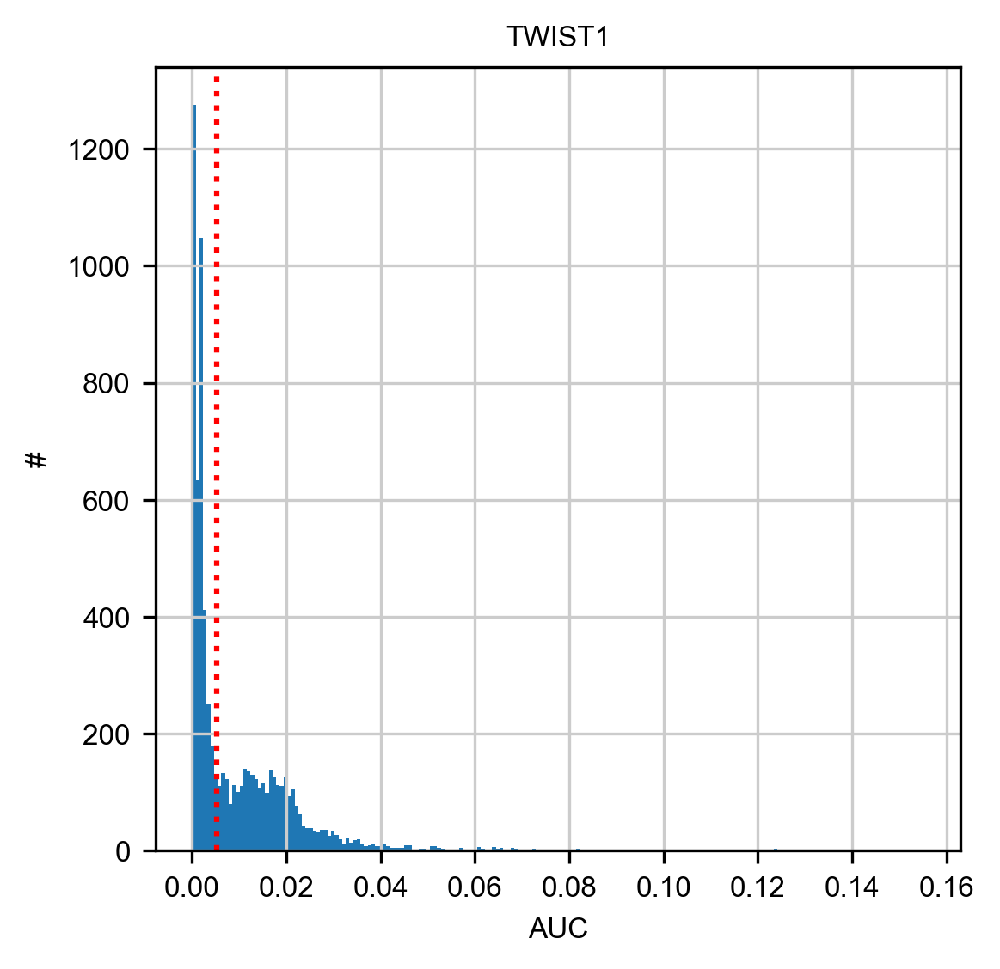

In [78]:
plot_binarization(auc_mtx, 'TWIST1', thresholds['TWIST1'])

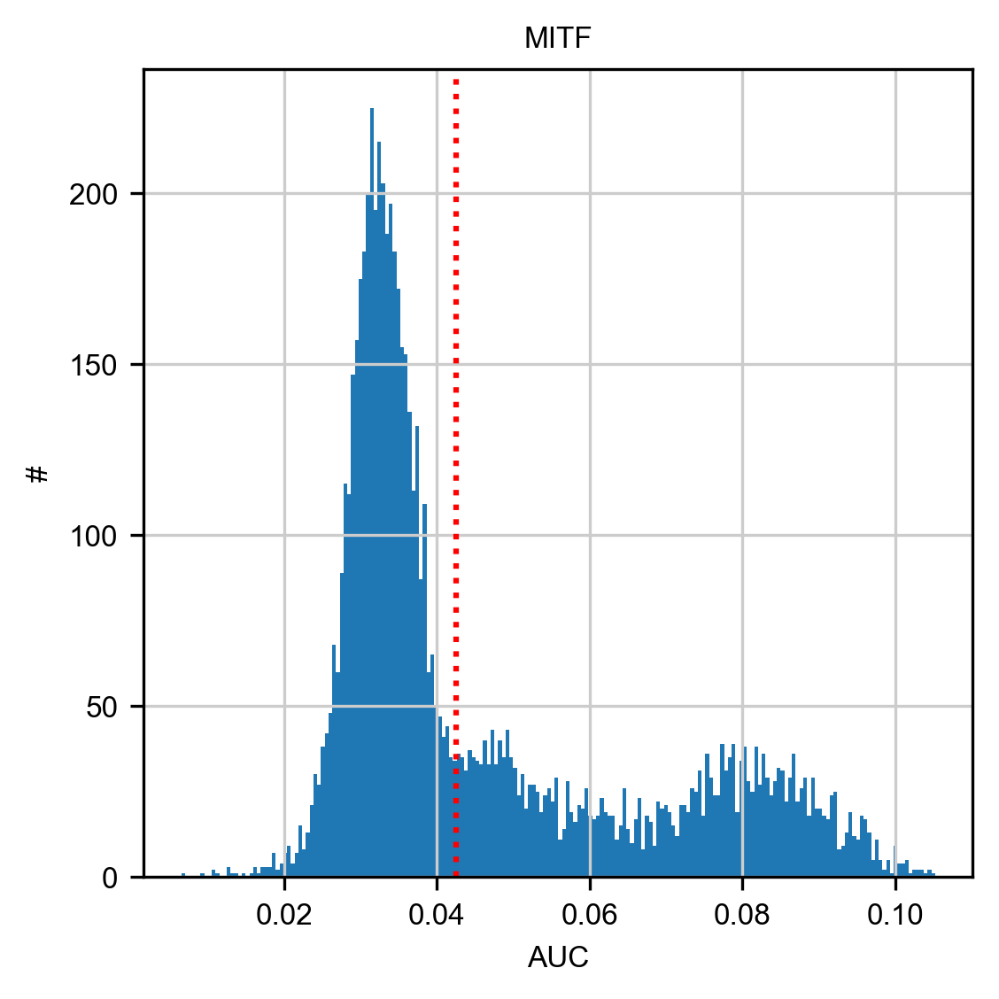

In [79]:
plot_binarization(auc_mtx, 'MITF', thresholds['MITF'])

### STEP 6: Non-linear projection and clustering

In this step a `scanpy.AnnData` object is created containing all metadata and results.

First, we select and retain only the most variable genes in the dataset.

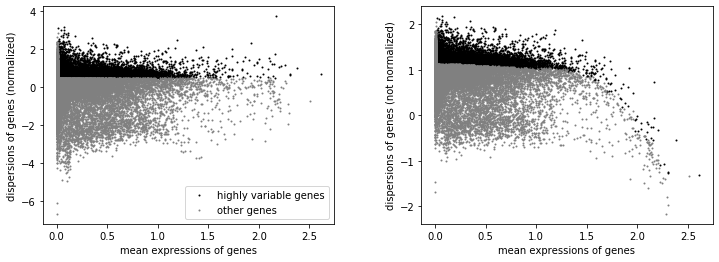

In [57]:
sc.pp.highly_variable_genes(adata)
sc.pl.highly_variable_genes(adata)
adata = adata[:, adata.var['highly_variable']]

Then we apply a linear-dimensional reduction technique (PCA).

Trying to set attribute `.obsm` of view, making a copy.
... storing 'sample_id' as categorical
... storing 'cell_type' as categorical
... storing 'cohort' as categorical
... storing 'patient_id' as categorical
... storing 'sex' as categorical
... storing 'treatment' as categorical
... storing 'treatment_group' as categorical
... storing 'lesion_type' as categorical
... storing 'site' as categorical


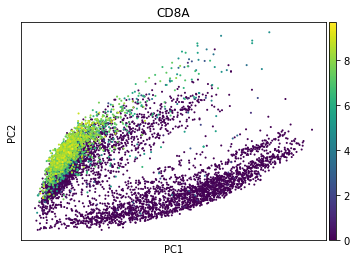

In [58]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca(adata, color='CD8A')

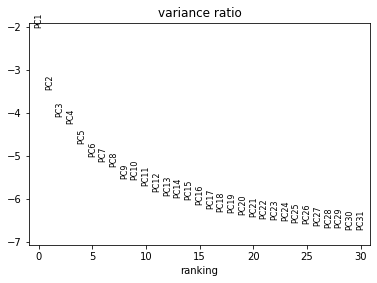

In [59]:
sc.pl.pca_variance_ratio(adata, log=True)

Followed by a tSNE projection.

In [60]:
sc.tl.tsne(adata)

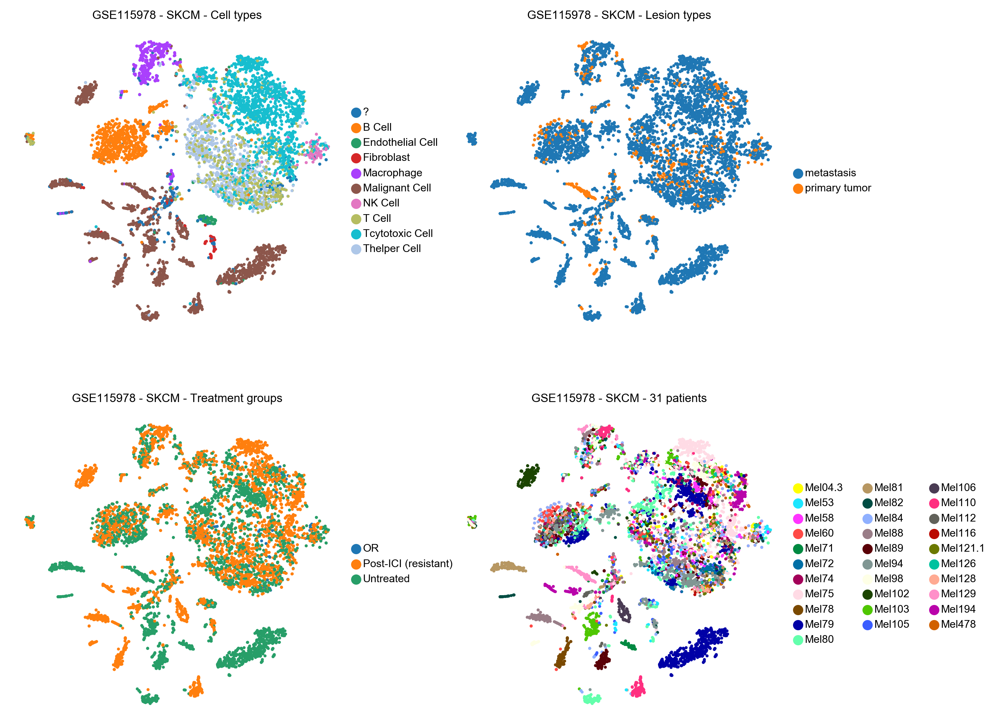

In [61]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_type', 'lesion_type', 'treatment_group', 'patient_id'], 
           title=['GSE115978 - SKCM - Cell types', 'GSE115978 - SKCM - Lesion types', 'GSE115978 - SKCM - Treatment groups',
                 'GSE115978 - SKCM - {} patients'.format(len(adata.obs.patient_id.unique()))], ncols=2)

We capture the non-linear projection based on PCA+tSNE for later storage in the loom file.

In [63]:
embedding_pca_tsne = pd.DataFrame(adata.obsm['X_tsne'], columns=[['_X', '_Y']], index=adata.obs_names)

We add all metadata derived from SCENIC to the `scanpy.AnnData` object.

In [64]:
add_scenic_metadata(adata, auc_mtx, regulons)
adata.write_h5ad(ANNDATA_FNAME)

We change the tSNE projection so that it relies on AUCell instead of PCA.

In [65]:
sc.tl.tsne(adata, use_rep='X_aucell')

In [66]:
embedding_aucell_tsne = pd.DataFrame(adata.obsm['X_tsne'], columns=[['_X', '_Y']], index=adata.obs_names)

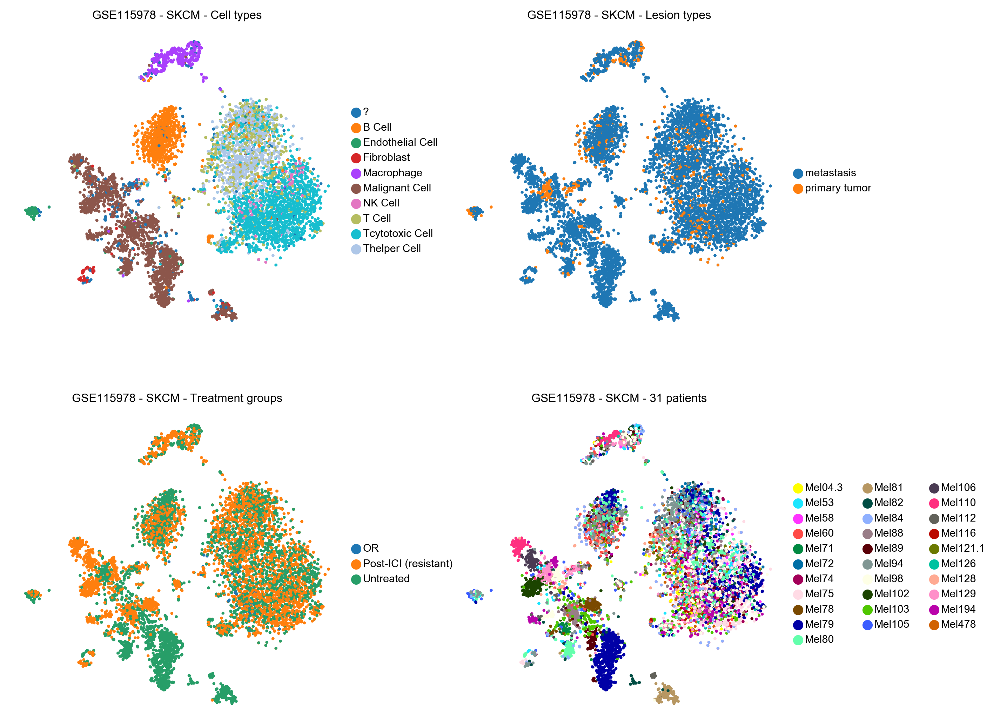

In [67]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_type', 'lesion_type', 'treatment_group', 'patient_id'], 
           title=['GSE115978 - SKCM - Cell types', 'GSE115978 - SKCM - Lesion types', 'GSE115978 - SKCM - Treatment groups',
                 'GSE115978 - SKCM - {} patients'.format(len(adata.obs.patient_id.unique()))], ncols=2)

With the metadata from SCENIC add to the `AnnData` object, we can create cellular scatterplots for regulon activity. In the example we compare MITF regulon enrichment with the expression of the MITF gene.

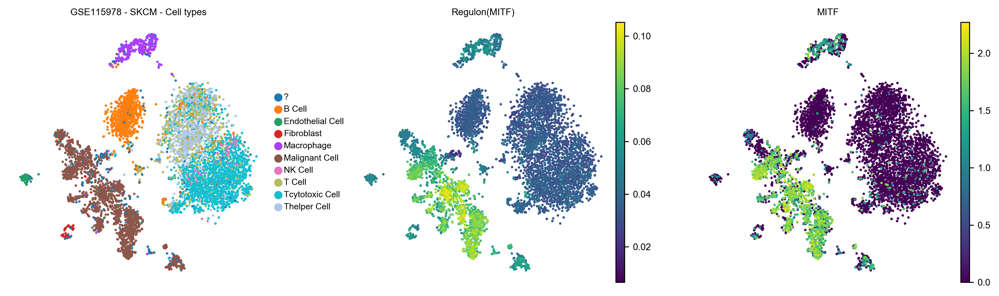

In [74]:
sc.pl.tsne(adata, color=['cell_type', 'Regulon(MITF)', 'MITF'],
           title=['GSE115978 - SKCM - Cell types', 'Regulon(MITF)', 'MITF'], ncols=3, use_raw=False)

We can also analyze the distribution of AUCell values via the plots in the `scanpy` package.

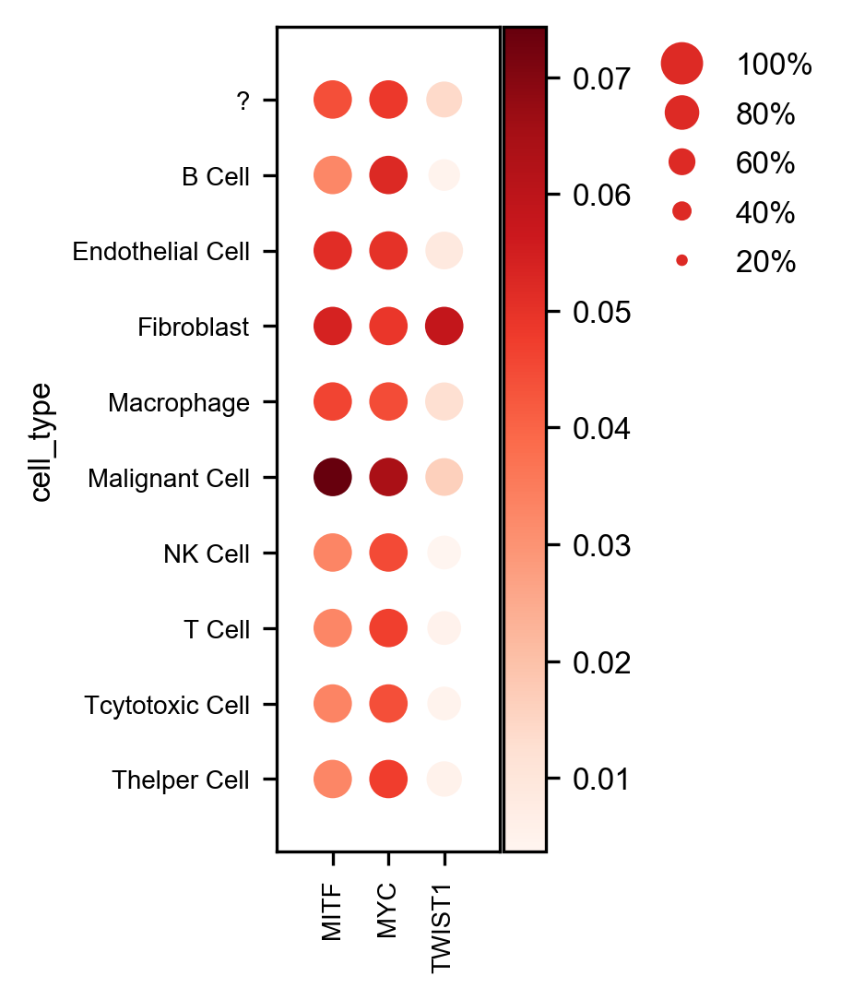

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[1.0499999999999998, 0, 0.2, 0.5, 0.25])

In [71]:
aucell_adata = sc.AnnData(X=auc_mtx.sort_index())
aucell_adata.obs = df_obs
sc.pl.dotplot(aucell_adata, ['MITF', 'MYC', 'TWIST1'], groupby='cell_type')

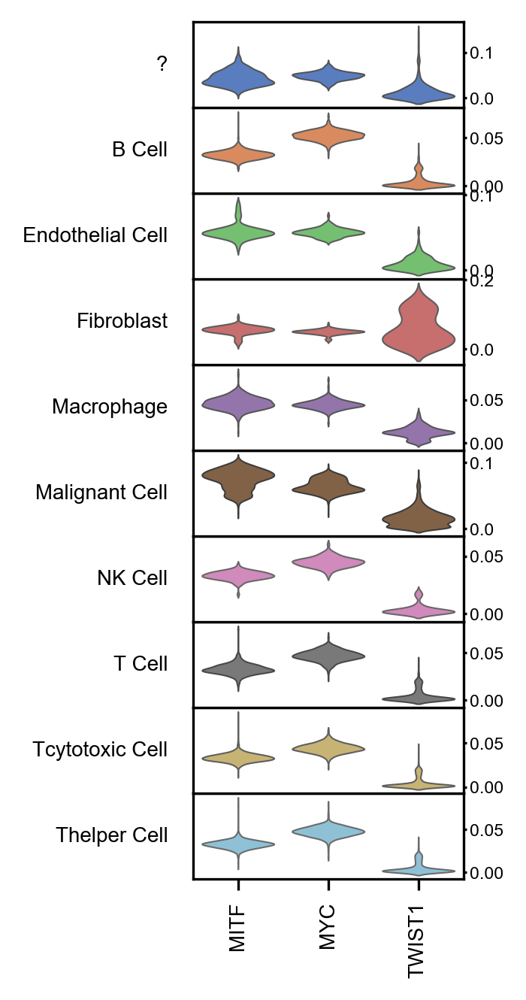

In [80]:
sc.pl.stacked_violin(aucell_adata, ['MITF', 'MYC', 'TWIST1'], groupby='cell_type')

### STEP 7: Export to SCope

In [68]:
export2loom(adata.to_df(), regulons, LOOM_FNAME,
            cell_annotations=adata.obs['cell_type'].to_dict(),
            embeddings=OrderedDict([('AUCell + tSNE', embedding_aucell_tsne), ('PCA + tSNE', embedding_pca_tsne)]),
            auc_mtx = auc_mtx,
            tree_structure=(),
            title='{}_{}'.format(TCGA_CODE, DATASET_ID),
            nomenclature="HGNC", 
            compress=True)

Regulon name does not seem to be compatible with SCOPE. It should include a space to allow selection of the TF. 
Please run: 
 regulons = [r.rename(r.name.replace('(+)',' ('+str(len(r))+'g)')) for r in regulons] 
or:
 regulons = [r.rename(r.name.replace('(',' (')) for r in regulons]


## GSE103322 - Head and Neck Squamous Cell Carcinoma (HNSC)

_Publication:_ Puram S et al. Single-Cell Transcriptomic Analysis of Primary and Metastatic Tumor Ecosystems in Head and Neck Cancer. Cell 2017
https://dx.doi.org/10.1016/j.cell.2017.10.044

_Data set acquisition:_ https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE103322


In [260]:
DATASET_ID = "GSE103322"
TCGA_CODE = 'HNSC'

Resources downloaded.

In [261]:
# Downloaded from GEO on 15 JUN 2019.
ALL_FNAME = os.path.join(RESOURCES_FOLDERNAME, "GSE103322_HNSCC_all_data.txt")

Results created.

In [262]:
METADATA_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.metadata.csv'.format(DATASET_ID))
EXP_MTX_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.tpm.csv'.format(DATASET_ID))
EXP_MTX_QC_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.qc.tpm.csv'.format(DATASET_ID))
ADJACENCIES_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.adjacencies.tsv'.format(DATASET_ID))
MOTIFS_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.motifs.csv'.format(DATASET_ID))
REGULONS_DAT_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.regulons.dat'.format(DATASET_ID))
AUCELL_MTX_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.auc.csv'.format(DATASET_ID))
ANNDATA_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.h5ad'.format(DATASET_ID))
LOOM_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}_{}.loom'.format(TCGA_CODE, DATASET_ID))

### STEP 0: Preprocessing

__CLEANING__

In [263]:
def process_gse103322(fname):
    # Load CSV file
    mtx = pd.read_csv(fname, sep='\t', index_col=0, skiprows=[1,2,3,4,5])
    
    # Extract gene symbol
    mtx.index = list(map(lambda g: g[1:-1], mtx.index))
    
    # Remove duplicate gene symbols (keep last when sorted ascending order according to row sum)
    mtx = mtx.iloc[mtx.sum(axis=1).argsort()]
    mtx = mtx[~mtx.index.duplicated(keep='last')]
    
    return mtx

In [264]:
df_mtx = process_gse103322(ALL_FNAME)
df_mtx.to_csv(EXP_MTX_FNAME, index=True)

In [265]:
cell_annotations = pd.read_csv(ALL_FNAME, sep='\t', index_col=0, low_memory=False).head(5)
cell_type = pd.Series(data=list(map(lambda t: t[0] if t[1] else 'Malignant Cell',
                                    zip(cell_annotations.T['non-cancer cell type'], 
                                        cell_annotations.T['classified as non-cancer cells'].map(float).map(bool)))),
                      index = cell_annotations.columns, name='cell_type').replace({'-Fibroblast': 'Fibroblast',
                  'myocyte': 'Myocyte',
                  'Endothelial': 'Endothelial Cell',
                  'Dendritic': 'Dendritic Cell',
                  'Mast': 'Mast Cell',
                  'T cell': 'T Cell',
                  'B cell': 'B Cell'})
lesion_type = pd.Series(data=list(map(lambda t: 'Lymph node' if t else 'Primary tumor',
                                    cell_annotations.T['Lymph node'].map(float).map(bool))),
                      index = cell_annotations.columns, name='lesion_type')
def clean_pid(s: str) -> str:
    m = re.match("HN(SCC)?_?(\d{1,2})_", s)
    if m:
        return 'MEEI{}'.format(int(m.group(2)))
    else:
        return 'MEEI9'
patient_id = pd.Series(data=cell_annotations.columns.map(clean_pid), index = cell_annotations.columns, name='patient_id')
df_metadata = pd.concat([cell_type, lesion_type, patient_id], axis=1).reset_index().rename(columns={'index': 'cell_id'})
df_metadata.to_csv(METADATA_FNAME, sep=',')
df_metadata.head()

,cell_id,cell_type,lesion_type,patient_id
0,HN28_P15_D06_S330_comb,Fibroblast,Lymph node,MEEI28
1,HN28_P6_G05_S173_comb,Fibroblast,Primary tumor,MEEI28
2,HN26_P14_D11_S239_comb,Malignant Cell,Lymph node,MEEI26
3,HN26_P14_H05_S281_comb,Fibroblast,Lymph node,MEEI26
4,HN26_P25_H09_S189_comb,Malignant Cell,Lymph node,MEEI26


__EXPRESSION MATRIX QC__

In [266]:
adata = sc.AnnData(X=mtx.T.sort_index())
df_obs = df_metadata.set_index('cell_id').sort_index()
adata.obs = df_obs
adata.var_names_make_unique()
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
adata.raw = adata #Store non-log transformed data as raw. This data can be used via the use_raw parameters available for many functions.
sc.pp.log1p(adata)
adata

AnnData object with n_obs × n_vars = 5902 × 21519 
    obs: 'cell_type', 'lesion_type', 'patient_id', 'n_genes'
    var: 'n_cells'

In [267]:
adata.to_df().to_csv(EXP_MTX_QC_FNAME)

### STEP 1: Network inference based on GRNBoost2 from CLI

For this step the CLI version of SCENIC is used. This step can be deployed on an High Performance Computing system.

_Output:_ List of adjacencies between a TF and its targets stored in `ADJACENCIES_FNAME`.

In [ ]:
!pyscenic grn {EXP_MTX_QC_FNAME} {HUMAN_TFS_FNAME} -o {ADJACENCIES_FNAME} --num_workers 32

```
2019-04-25 09:07:25,605 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.
2019-04-25 09:08:25,870 - pyscenic.cli.pyscenic - INFO - Inferring regulatory networks.
preparing dask client
parsing input
creating dask graph
32 partitions
computing dask graph
not shutting down client, client was created externally
finished
2019-04-25 10:55:14,802 - pyscenic.cli.pyscenic - INFO - Writing results to file.
```

### STEP 2-3: Regulon prediction aka cisTarget from CLI

For this step the CLI version of SCENIC is used. This step can be deployed on an High Performance Computing system.

_Output:_ List of adjacencies between a TF and its targets stored in `MOTIFS_FNAME`.

In [ ]:
!pyscenic ctx {ADJACENCIES_FNAME} {DBS_PARAM} \
            --annotations_fname {MOTIF_ANNOTATIONS_FNAME} \
            --expression_mtx_fname {EXP_MTX_QC_FNAME} \
            --output {MOTIFS_FNAME} \
            --num_workers 32

```
2019-04-26 09:44:55,314 - pyscenic.cli.pyscenic - INFO - Creating modules.
2019-04-26 09:45:00,335 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.
2019-04-26 09:49:37,344 - pyscenic.cli.pyscenic - INFO - Loading databases.
2019-04-26 09:49:37,345 - pyscenic.cli.pyscenic - INFO - Calculating regulons.
2019-04-26 10:22:54,812 - pyscenic.cli.pyscenic - INFO - Writing results to file.
```

In [268]:
df_motifs = load_motifs(MOTIFS_FNAME)

### STEP 4: Cellular enrichment aka AUCell

__REGULON CREATION__

In [269]:
regulons = derive_regulons(df_motifs)
# Pickle these regulons.
with open(REGULONS_DAT_FNAME, 'wb') as f:
    pickle.dump(regulons, f)

__AUCELL__

In [21]:
%%time
auc_mtx = aucell(df_mtx, regulons, num_workers=32)
auc_mtx.to_csv(AUCELL_MTX_FNAME)

CPU times: user 18.2 s, sys: 8.92 s, total: 27.2 s
Wall time: 30.7 s


### STEP 6: Non-linear projection and clustering

In this step a `scanpy.AnnData` object is created containing all metadata and results.

First, we select and retain only the most variable genes in the dataset.

In [271]:
sc.pp.highly_variable_genes(adata)
adata = adata[:, adata.var['highly_variable']]

Then we apply a linear-dimensional reduction technique (PCA).

In [272]:
sc.tl.pca(adata, svd_solver='arpack')

Trying to set attribute `.obsm` of view, making a copy.


Followed by a tSNE projection.

In [273]:
sc.tl.tsne(adata)

... storing 'cell_type' as categorical
... storing 'lesion_type' as categorical
... storing 'patient_id' as categorical


saving figure to file /Users/bramvandesande/Projects/lcb/protocol/figures/tsne - GSE103322 - PCA+tSNE.svg


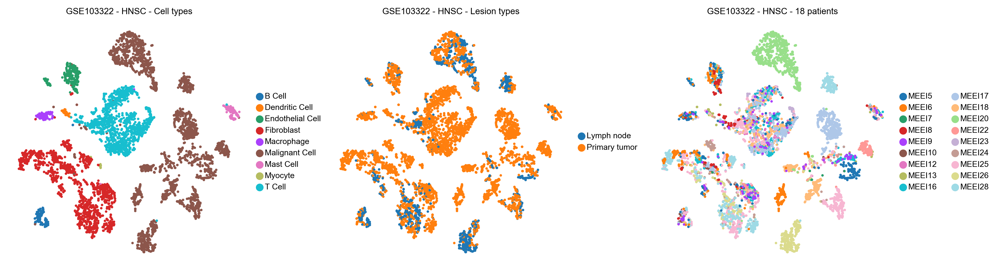

In [274]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_type', 'lesion_type','patient_id'], 
           title=['GSE103322 - HNSC - Cell types', 'GSE103322 - HNSC - Lesion types',
                 'GSE103322 - HNSC - {} patients'.format(len(adata.obs.patient_id.unique()))], ncols=3,
          save=' - GSE103322 - PCA+tSNE.svg')

We capture the non-linear projection based on PCA+tSNE for later storage in the loom file.

In [275]:
embedding_pca_tsne = pd.DataFrame(adata.obsm['X_tsne'], columns=[['_X', '_Y']], index=adata.obs_names)

We add all metadata derived from SCENIC to the `scanpy.AnnData` object.

In [276]:
add_scenic_metadata(adata, auc_mtx, regulons)
adata.write_h5ad(ANNDATA_FNAME)

We change the tSNE projection so that it relies on AUCell instead of PCA.

In [277]:
sc.tl.tsne(adata, use_rep='X_aucell')

In [278]:
embedding_aucell_tsne = pd.DataFrame(adata.obsm['X_tsne'], columns=[['_X', '_Y']], index=adata.obs_names)

saving figure to file /Users/bramvandesande/Projects/lcb/protocol/figures/tsne - GSE103322 - AUCell+tSNE.svg


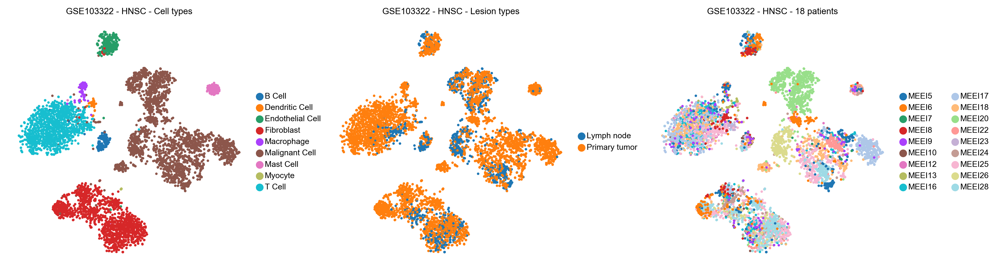

In [279]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_type', 'lesion_type','patient_id'], 
           title=['GSE103322 - HNSC - Cell types', 'GSE103322 - HNSC - Lesion types',
                 'GSE103322 - HNSC - {} patients'.format(len(adata.obs.patient_id.unique()))], ncols=3,
          save=' - GSE103322 - AUCell+tSNE.svg')

To find cell type specific regulators we use a Z score (i.e. the average AUCell score for the cells of a give type are standardized using the overall average AUCell scores and its standard deviation).

In [280]:
df_obs = adata.obs
signature_column_names = list(df_obs.select_dtypes('number').columns)
signature_column_names = list(filter(lambda s: s.startswith('Regulon('), signature_column_names))
df_scores = df_obs[signature_column_names + ['cell_type']]
df_results = ((df_scores.groupby(by='cell_type').mean() - df_obs[signature_column_names].mean())/ df_obs[signature_column_names].std()).stack().reset_index().rename(columns={'level_1': 'regulon', 0:'Z'})
df_results['regulon'] = list(map(lambda s: s[8:-1], df_results.regulon))
df_results[(df_results.Z >= 3.0)].sort_values('Z', ascending=False).head()

,cell_type,regulon,Z
2650,Myocyte,PPARA,14.056566
2611,Myocyte,MYOG,13.692796
2610,Myocyte,MYOD1,13.162975
2609,Myocyte,MYF6,12.873788
2674,Myocyte,SNAI3,11.989173


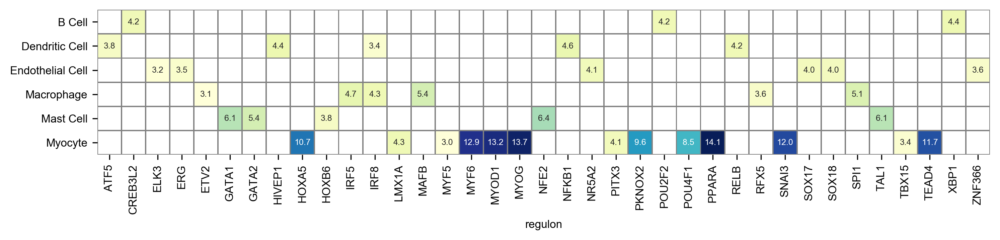

In [281]:
df_heatmap = pd.pivot_table(data=df_results[df_results.Z >= 3.0].sort_values('Z', ascending=False),
                           index='cell_type', columns='regulon', values='Z')
#df_heatmap.drop(index='Myocyte', inplace=True) # We leave out Myocyte because many TFs are highly enriched (becuase of small number of cells).
fig, ax1 = plt.subplots(1, 1, figsize=(10, 8))
sns.heatmap(df_heatmap, ax=ax1, annot=True, fmt=".1f", linewidths=.7, cbar=False, square=True, linecolor='gray', 
            cmap="YlGnBu", annot_kws={"size": 6})
ax1.set_ylabel('')
savesvg('heatmap - GSE103322 - regulons.svg', fig)

saving figure to file /Users/bramvandesande/Projects/lcb/protocol/figures/tsne - GSE103322 - regulons.svg


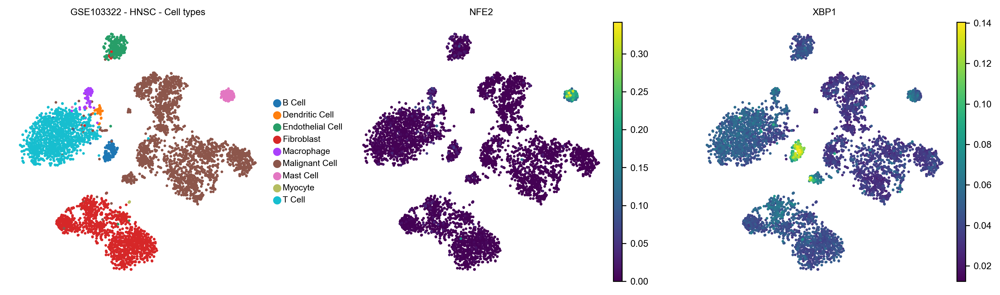

In [282]:
sc.pl.tsne(adata, color=['cell_type', 'Regulon(NFE2)', 'Regulon(XBP1)'],
           title=['GSE103322 - HNSC - Cell types', 'NFE2', 'XBP1'], ncols=3, use_raw=False,
          save=' - GSE103322 - regulons.svg')

### STEP 7: Export to SCope

In [283]:
export2loom(adata.to_df(), regulons, LOOM_FNAME,
            cell_annotations=adata.obs['cell_type'].to_dict(),
            embeddings=OrderedDict([('AUCell + tSNE', embedding_aucell_tsne), ('PCA + tSNE', embedding_pca_tsne)]),
            auc_mtx = auc_mtx,
            tree_structure=(),
            title='{}_{}'.format(TCGA_CODE, DATASET_ID),
            nomenclature="HGNC", 
            compress=True)

Regulon name does not seem to be compatible with SCOPE. It should include a space to allow selection of the TF. 
Please run: 
 regulons = [r.rename(r.name.replace('(+)',' ('+str(len(r))+'g)')) for r in regulons] 
or:
 regulons = [r.rename(r.name.replace('(',' (')) for r in regulons]


## E-MTAB-6149/E-MTAB-6653 - Lung Squamous Cell Carcinoma and Lung Adenocarcinoma (LUSC & LUAD)

_Publication:_ Lambrechts D et al. Phenotype molding of stromal cells in the lung tumor microenvironment. Nature Medicine 2018

https://dx.doi.org/10.1038/s41591-018-0096-5

_Data set acquisition:_

https://www.ebi.ac.uk/arrayexpress/experiments/E-MTAB-6149/

https://www.ebi.ac.uk/arrayexpress/experiments/E-MTAB-6653/

In [230]:
DATASET_ID = "E-MTAB-6149_6653"
TCGA_CODE = 'LUAD_LUSC'

Resources downloaded.

In [240]:
# Directly provided by the author.
# The input matrix was the normalized expression matrix, output from Seurat, from which 9,919 genes passed the filtering 
# (sum of expression > 3 × 0.005 × 52,698 and detected in at least 0.5% of the cells).
ANNOTATIONS_FNAME = os.path.join(RESOURCES_FOLDERNAME, 'b_thienpont.clusters.txt')
EXP_MTX_FNAME = os.path.join(RESOURCES_FOLDERNAME, 'E-MTAB-6149_6653.expr.tsv')

Results created.

In [232]:
METADATA_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.metadata.csv'.format(DATASET_ID))
EXP_MTX_QC_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.qc.expr.csv'.format(DATASET_ID))
ADJACENCIES_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.adjacencies.tsv'.format(DATASET_ID))
MOTIFS_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.motifs.csv'.format(DATASET_ID))
REGULONS_DAT_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.regulons.dat'.format(DATASET_ID))
AUCELL_MTX_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.auc.csv'.format(DATASET_ID))
ANNDATA_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.h5ad'.format(DATASET_ID))
LOOM_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}_{}.loom'.format(TCGA_CODE, DATASET_ID))

__METADATA CLEANING__

In [235]:
annotations = pd.read_csv(ANNOTATIONS_FNAME, sep=' ', index_col=0)
annotations['lesion_type'] = ['LC' if row['CellFromTumor'] else 'NL' for _, row in annotations.iterrows()]
annotations = annotations[['cell', 'CellType', 'Sample', 'Patientnumber', 'lesion_type']].rename(columns={
    'cell': 'cell_id',
    'Sample': 'sample_id',
    'Patientnumber': 'patient_id',
    'CellType': 'cell_type'}).set_index('cell_id')
annotations['cell_type'] = annotations.cell_type.replace({'T_cell': 'T cell',
                               'B_cell': 'B cell',
                               'Fibro': 'Fibroblast',
                               'tumor': 'Malignant cell',
                               'Epi': 'Epithelial cell', 
                               'EC': 'Endothelial cell',
                               'Alveolar': 'Alveolar cell',
                               'Myeloid': 'Meyloid cell'})
annotations['patient_id'] = annotations['patient_id'].map(str)
annotations['sample_id'] = annotations['sample_id'].map(str)
annotations.to_csv(METADATA_FNAME, sep=',')
annotations.head()

,cell_type,sample_id,patient_id,lesion_type
cell_id,,,,
AGTTCTACGCATAC_1,Alveolar cell,1,1,LC
ATACCGGATCGTGA_1,Alveolar cell,1,1,LC
ATATACGATGCCCT_1,Alveolar cell,1,1,LC
GAACGTTGATGGTC_1,Alveolar cell,1,1,LC
TCAGACGAGCAAGG_1,Alveolar cell,1,1,LC


__EXPRESSION MATRIX QC__

In [236]:
df_mtx = pd.read_csv(EXP_MTX_FNAME, sep='\t', index_col=0)

In [238]:
adata = sc.AnnData(X=df_mtx.T.sort_index())
adata.obs = annotations.sort_index()
adata.var_names_make_unique()
adata.raw = adata #Store non-log transformed data as raw. This data can be used via the use_raw parameters available for many functions.
sc.pp.log1p(adata)
adata

AnnData object with n_obs × n_vars = 51628 × 9919 
    obs: 'cell_type', 'sample_id', 'patient_id', 'lesion_type', 'n_genes'
    var: 'n_cells'

In [239]:
adata.to_df().to_csv(EXP_MTX_QC_FNAME)

### STEP 1: Network inference based on GRNBoost2 from CLI

For this step the CLI version of SCENIC is used. This step can be deployed on an High Performance Computing system.

_Output:_ List of adjacencies between a TF and its targets stored in `ADJACENCIES_FNAME`.

In [ ]:
!pyscenic grn {EXP_MTX_QC_FNAME} {HUMAN_TFS_FNAME} -o {ADJACENCIES_FNAME} --num_workers 8

```
2019-05-02 21:24:43,654 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.
2019-05-02 21:27:06,425 - pyscenic.cli.pyscenic - INFO - Inferring regulatory networks.
preparing dask client
parsing input
creating dask graph
8 partitions
computing dask graph
finished
2019-05-03 17:38:49,059 - pyscenic.cli.pyscenic - INFO - Writing results to file.
```

### STEP 2-3: Regulon prediction aka cisTarget from CLI

For this step the CLI version of SCENIC is used. This step can be deployed on an High Performance Computing system.

_Output:_ List of adjacencies between a TF and its targets stored in `MOTIFS_FNAME`.

In [ ]:
!pyscenic ctx {ADJACENCIES_FNAME} {DBS_PARAM} \
            --annotations_fname {MOTIF_ANNOTATIONS_FNAME} \
            --expression_mtx_fname {EXP_MTX_QC_FNAME} \
            --output {MOTIFS_FNAME} \
            --num_workers 18

```
2019-05-06 20:50:20,880 - pyscenic.cli.pyscenic - INFO - Creating modules.
2019-05-06 20:50:23,528 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.
2019-05-06 20:55:30,410 - pyscenic.cli.pyscenic - INFO - Loading databases.
2019-05-06 20:55:30,410 - pyscenic.cli.pyscenic - INFO - Calculating regulons.
2019-05-06 21:31:19,109 - pyscenic.cli.pyscenic - INFO - Writing results to file.
```

In [241]:
df_motifs = load_motifs(MOTIFS_FNAME)

### STEP 4: Cellular enrichment aka AUCell

__REGULON CREATION__

In [242]:
regulons = derive_regulons(df_motifs)
# Pickle these regulons.
with open(REGULONS_DAT_FNAME, 'wb') as f:
    pickle.dump(regulons, f)

__AUCELL__

In [24]:
%%time
auc_mtx = aucell(exp_mtx, regulons, num_workers=18)

CPU times: user 54.2 s, sys: 31.2 s, total: 1min 25s
Wall time: 1min 43s


### STEP 6: Non-linear projection and clustering

In this step a `scanpy.AnnData` object is created containing all metadata and results.

First, we select and retain only the most variable genes in the dataset.

In [244]:
sc.pp.highly_variable_genes(adata)
adata = adata[:, adata.var['highly_variable']]

Then we apply a linear-dimensional reduction technique (PCA).

In [245]:
sc.tl.pca(adata, svd_solver='arpack')

Trying to set attribute `.obsm` of view, making a copy.


Followed by a tSNE projection.

In [246]:
sc.tl.tsne(adata)

saving figure to file /Users/bramvandesande/Projects/lcb/protocol/figures/tsne - E-MTAB-6149_6653 - PCA+tSNE.svg


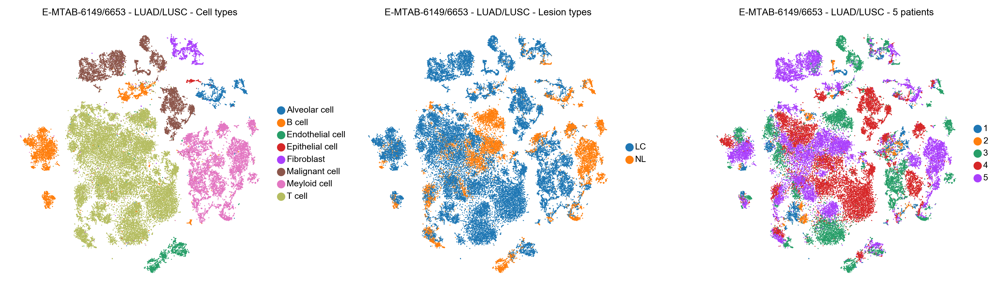

In [248]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_type', 'lesion_type', 'patient_id'], 
           title=['E-MTAB-6149/6653 - LUAD/LUSC - Cell types', 
                  'E-MTAB-6149/6653 - LUAD/LUSC - Lesion types', 
                  'E-MTAB-6149/6653 - LUAD/LUSC - {} patients'.format(len(adata.obs.patient_id.unique()))], ncols=3,
          save=' - E-MTAB-6149_6653 - PCA+tSNE.svg')

We capture the non-linear projection based on PCA+tSNE for later storage in the loom file.

In [249]:
embedding_pca_tsne = pd.DataFrame(adata.obsm['X_tsne'], columns=[['_X', '_Y']], index=adata.obs_names)

We add all metadata derived from SCENIC to the `scanpy.AnnData` object.

In [250]:
add_scenic_metadata(adata, auc_mtx, regulons)
adata.write_h5ad(ANNDATA_FNAME)

We change the tSNE projection so that it relies on AUCell instead of PCA.

In [251]:
sc.tl.tsne(adata, use_rep='X_aucell')

In [252]:
embedding_aucell_tsne = pd.DataFrame(adata.obsm['X_tsne'], columns=[['_X', '_Y']], index=adata.obs_names)

saving figure to file /Users/bramvandesande/Projects/lcb/protocol/figures/tsne - E-MTAB-6149_6653 - AUCell+tSNE.svg


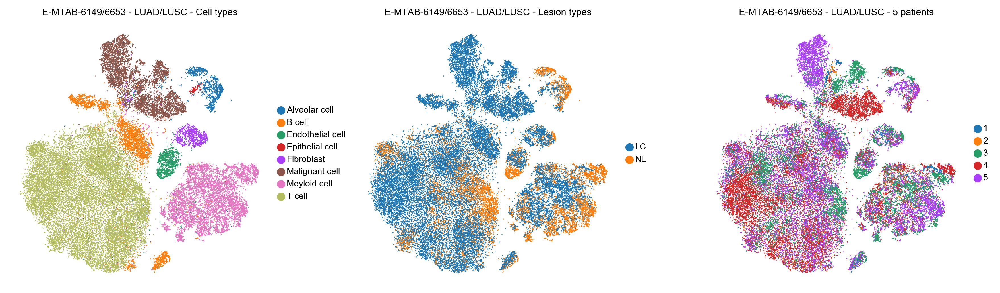

In [253]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_type', 'lesion_type', 'patient_id'], 
           title=['E-MTAB-6149/6653 - LUAD/LUSC - Cell types', 
                  'E-MTAB-6149/6653 - LUAD/LUSC - Lesion types', 
                  'E-MTAB-6149/6653 - LUAD/LUSC - {} patients'.format(len(adata.obs.patient_id.unique()))], ncols=3,
          save=' - E-MTAB-6149_6653 - AUCell+tSNE.svg')

To find cell type specific regulators we use a Z score (i.e. the average AUCell score for the cells of a give type are standardized using the overall average AUCell scores and its standard deviation).

In [254]:
df_obs = adata.obs
signature_column_names = list(df_obs.select_dtypes('number').columns)
signature_column_names = list(filter(lambda s: s.startswith('Regulon('), signature_column_names))
df_scores = df_obs[signature_column_names + ['cell_type']]
df_results = ((df_scores.groupby(by='cell_type').mean() - df_obs[signature_column_names].mean())/ df_obs[signature_column_names].std()).stack().reset_index().rename(columns={'level_1': 'regulon', 0:'Z'})
df_results['regulon'] = list(map(lambda s: s[8:-1], df_results.regulon))
df_results[(df_results.Z >= 3.0)].sort_values('Z', ascending=False).head()

,cell_type,regulon,Z
696,Epithelial cell,RFX3,9.483804
695,Epithelial cell,RFX2,6.800633
623,Epithelial cell,GLIS3,5.315495
517,Endothelial cell,SOX7,4.738095
108,Alveolar cell,NKX2-1,4.621914


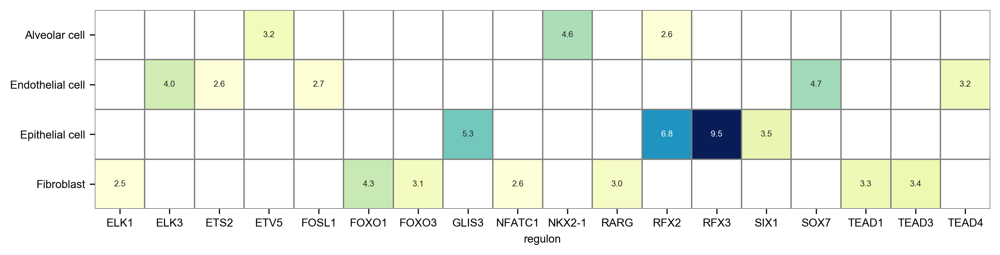

In [257]:
df_heatmap = pd.pivot_table(data=df_results[df_results.Z >= 2.5].sort_values('Z', ascending=False),
                           index='cell_type', columns='regulon', values='Z')
fig, ax1 = plt.subplots(1, 1, figsize=(10, 8))
sns.heatmap(df_heatmap, ax=ax1, annot=True, fmt=".1f", linewidths=.7, cbar=False, square=True, linecolor='gray', 
            cmap="YlGnBu", annot_kws={"size": 6})
ax1.set_ylabel('')
savesvg('heatmap - E-MTAB-6149_6653 - regulons.svg', fig)

saving figure to file /Users/bramvandesande/Projects/lcb/protocol/figures/tsne - E-MTAB-6149_6653 - regulons.svg


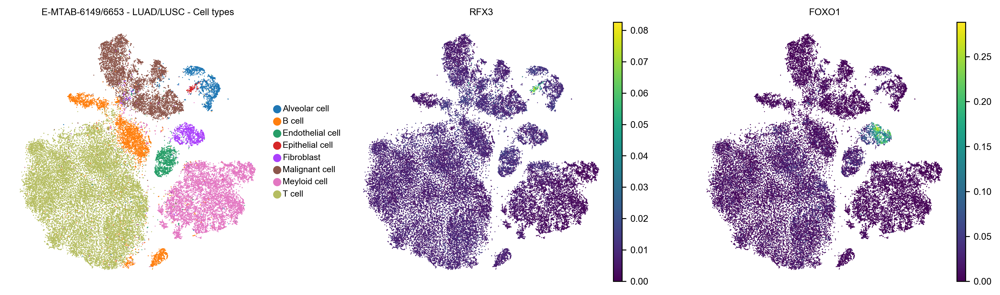

In [258]:
sc.pl.tsne(adata, color=['cell_type', 'Regulon(RFX3)', 'Regulon(FOXO1)'],
           title=['E-MTAB-6149/6653 - LUAD/LUSC - Cell types', 'RFX3', 'FOXO1'], ncols=3, use_raw=False,
          save=' - E-MTAB-6149_6653 - regulons.svg')

### STEP 7: Export to SCope

In [259]:
export2loom(adata.to_df(), regulons, LOOM_FNAME,
            cell_annotations=adata.obs['cell_type'].to_dict(),
            embeddings=OrderedDict([('AUCell + tSNE', embedding_aucell_tsne), ('PCA + tSNE', embedding_pca_tsne)]),
            auc_mtx = auc_mtx,
            tree_structure=(),
            title='{}_{}'.format(TCGA_CODE, DATASET_ID),
            nomenclature="HGNC", 
            compress=True)

Regulon name does not seem to be compatible with SCOPE. It should include a space to allow selection of the TF. 
Please run: 
 regulons = [r.rename(r.name.replace('(+)',' ('+str(len(r))+'g)')) for r in regulons] 
or:
 regulons = [r.rename(r.name.replace('(',' (')) for r in regulons]
